# MODELOS DE BENCHMARK

In [81]:
import warnings
warnings.filterwarnings("ignore")
import pandas as pd
import numpy as np
import plotly.express as px
import seaborn as sns
import matplotlib.dates as mdates
import mplfinance as mpf
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.holtwinters import SimpleExpSmoothing
from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error
import math
from sklearn.model_selection import GridSearchCV
from keras.wrappers.scikit_learn import KerasRegressor

##  Preparación de datos 
para el modelamiento de la series se escogerá el precio de serie de la acción. También Se asignará la fecha como eje x. Así mismo se hará la división dde los datos entre entrenamiento y prueba 

In [82]:
data = pd.read_csv(r"C:\Users\claud\OneDrive - Universidad del Norte\Escritorio\Series de tiempo\Natural_Gas_data.csv")


In [83]:
data['date'] = pd.to_datetime(data['date'])  

data.set_index('date', inplace=True)
y = data['close'].values

train_size = int(len(y) * 0.85)

y_train = y[:train_size]
y_test = y[train_size:]






In [94]:
import pandas as pd
import numpy as np
import plotly.express as px
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error

metrics_list = []

def plot_model_results_plotly(y_train, y_train_pred, y_test, y_pred, data_index, train_size, title):
    # Crear un índice completo basado en la longitud total de los datos
    data_index_full = data_index[:len(y_train) + len(y_test)]
    
    # Asegurar que todas las listas tengan la misma longitud
    y_train_extended = np.concatenate([y_train, [None] * len(y_test)])
    y_train_pred_full = np.concatenate([y_train_pred, [None] * (len(y_train_extended) - len(y_train_pred))])
    y_test_extended = np.concatenate([[None] * len(y_train), y_test])
    y_pred_full = np.concatenate([[None] * len(y_train), y_pred])

    # Crear DataFrame para la gráfica
    df_plot = pd.DataFrame({
        'Fecha': data_index_full,
        'Datos de entrenamiento': y_train_extended,
        'Modelo entrenado': y_train_pred_full,
        'Datos de prueba': y_test_extended,
        'Predicción': y_pred_full
    })

    # Graficar con Plotly
    fig = px.line(
        df_plot, x='Fecha',
        y=['Datos de entrenamiento', 'Modelo entrenado', 'Datos de prueba', 'Predicción'],
        title=title, labels={'value': 'Valor', 'Fecha': 'Fecha'}
    )
    fig.show()


In [95]:

def calculate_and_store_metrics(model, model_name, y_train, y_train_pred, y_test, y_pred):
    mape = mean_absolute_percentage_error(y_test, y_pred)
    rmse = mean_squared_error(y_test, y_pred, squared=False)

    metrics_list.append({
        'Modelo': model_name,
        'MAPE': mape,
        'RMSE': rmse,
    })


In [103]:
from scipy.stats import shapiro
from statsmodels.stats.diagnostic import acorr_ljungbox, het_breuschpagan
import statsmodels.api as sm
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf
import numpy as np

def check_model_assumptions(model, y_train, y_train_pred, y_test, y_test_pred):
    # Calcular los residuales
    resid_train = y_train - y_train_pred
    resid_test = y_test - y_test_pred

    print("\n----- Pruebas de Hipótesis sobre los Supuestos -----")

    # 1. Prueba de Normalidad (Shapiro-Wilk)
    stat, p_value = shapiro(resid_train)
    print(f"Shapiro-Wilk p-value (Entrenamiento): {p_value:.4f}")
    if p_value < 0.05:
        print("Conclusión: Los residuales NO siguen una distribución normal.\n")
    else:
        print("Conclusión: Los residuales siguen una distribución normal.\n")

    # 2. Prueba de Autocorrelación (Ljung-Box)
    lb_test = acorr_ljungbox(resid_train, lags=[10], return_df=True)
    lb_p_value = lb_test['lb_pvalue'].values[0]
    print(f"Ljung-Box p-value: {lb_p_value:.4f}")
    if lb_p_value < 0.05:
        print("Conclusión: Hay autocorrelación significativa en los residuales.\n")
    else:
        print("Conclusión: No hay autocorrelación significativa en los residuales.\n")

    # 3. Prueba de Homocedasticidad (Breusch-Pagan)
    exog = sm.add_constant(np.arange(len(resid_train)).reshape(-1, 1))
    _, bp_p_value, _, _ = het_breuschpagan(resid_train, exog)
    print(f"Breusch-Pagan p-value: {bp_p_value:.4f}")
    if bp_p_value < 0.05:
        print("Conclusión: No hay homocedasticidad (varianza no constante).\n")
    else:
        print("Conclusión: Hay homocedasticidad (varianza constante).\n")

    # Graficar los residuales
    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    fig.suptitle('Verificación de los Supuestos del Modelo')

    # Histograma de los residuales de entrenamiento
    axes[0, 0].hist(resid_train, bins=20, edgecolor='black')
    axes[0, 0].set_title('Histograma (Entrenamiento)')
    axes[0, 0].set_xlabel('Residual')
    axes[0, 0].set_ylabel('Frecuencia')

    # Q-Q Plot de los residuales de entrenamiento
    sm.qqplot(resid_train, line='s', ax=axes[0, 1])
    axes[0, 1].set_title('Q-Q Plot (Entrenamiento)')

    # ACF de los residuales de entrenamiento
    plot_acf(resid_train, ax=axes[0, 2], lags=30)
    axes[0, 2].set_title('ACF (Entrenamiento)')

    # Histograma de los residuales de prueba
    axes[1, 0].hist(resid_test, bins=20, edgecolor='black')
    axes[1, 0].set_title('Histograma (Prueba)')
    axes[1, 0].set_xlabel('Residual')
    axes[1, 0].set_ylabel('Frecuencia')

    # Q-Q Plot de los residuales de prueba
    sm.qqplot(resid_test, line='s', ax=axes[1, 1])
    axes[1, 1].set_title('Q-Q Plot (Prueba)')

    # ACF de los residuales de prueba
    plot_acf(resid_test, ax=axes[1, 2], lags=30)
    axes[1, 2].set_title('ACF (Prueba)')

    plt.tight_layout()
    plt.show()


## Suavización exponencial 
### Suavización exponencial simple


In [104]:

def optimize_exponential_smoothing(y_train, y_test, model_name, trend=None, seasonal=None, seasonal_periods=None):
    best_aic = float('inf')
    best_params = None
    best_model = None

    smoothing_level_values = np.linspace(0.1, 1.0, 10)
    smoothing_slope_values = np.linspace(0.1, 1.0, 10)
    smoothing_seasonal_values = np.linspace(0.1, 1.0, 10)
    seasonal_periods_values = [ 2, 3, 4, 6, 12]

    for alpha in smoothing_level_values:
        for beta in smoothing_slope_values:
            if seasonal:
                for gamma in smoothing_seasonal_values:
                    for period in seasonal_periods_values:
                        try:
                            model = ExponentialSmoothing(y_train, trend=trend, seasonal=seasonal, 
                                                         seasonal_periods=period).fit(
                                smoothing_level=alpha, smoothing_slope=beta, smoothing_seasonal=gamma, optimized=False)
                            aic = model.aic
                            if aic < best_aic:
                                best_aic, best_params, best_model = aic, (alpha, beta, gamma, period), model
                        except Exception as e:
                            print(f"Error: {e}")
                            continue
            else:
                try:
                    model = ExponentialSmoothing(y_train, trend=trend).fit(
                        smoothing_level=alpha, smoothing_slope=beta, optimized=False)
                    aic = model.aic
                    if aic < best_aic:
                        best_aic, best_params, best_model = aic, (alpha, beta), model
                except Exception as e:
                    print(f"Error: {e}")
                    continue

    y_train_pred = best_model.fittedvalues
    y_pred = best_model.forecast(steps=len(y_test))

    calculate_and_store_metrics(best_model, model_name, y_train, y_train_pred, y_test, y_pred)
    plot_model_results_plotly(y_train, y_train_pred, y_test, y_pred, data.index, len(y_train), model_name)
    check_model_assumptions(best_model, y_train, y_train_pred, y_test, y_pred)
    print(f"Mejores parámetros para {model_name}: {best_params} con AIC={best_aic}")



----- Pruebas de Hipótesis sobre los Supuestos -----
Shapiro-Wilk p-value (Entrenamiento): 0.0000
Conclusión: Los residuales NO siguen una distribución normal.

Ljung-Box p-value: 0.0001
Conclusión: Hay autocorrelación significativa en los residuales.

Breusch-Pagan p-value: 0.0000
Conclusión: No hay homocedasticidad (varianza no constante).



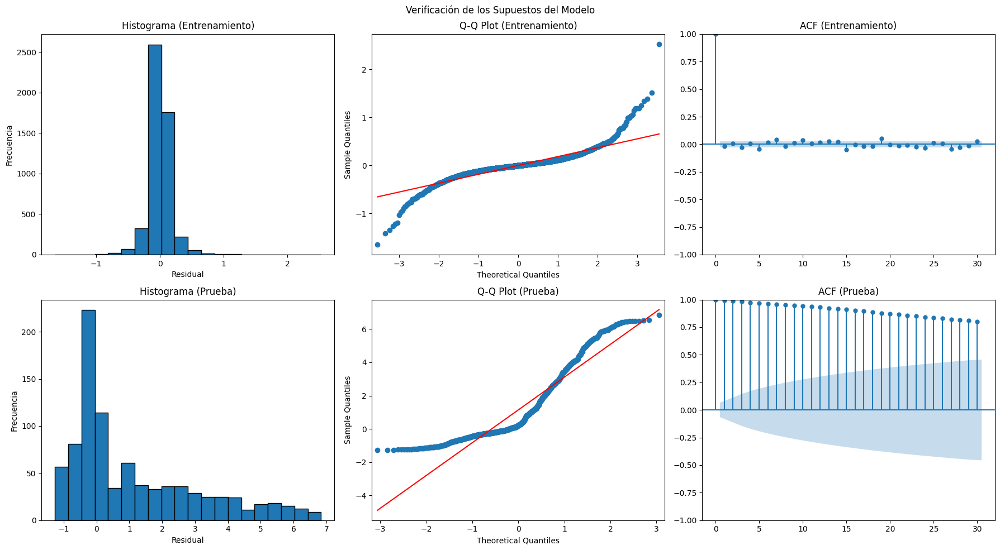

Mejores parámetros para Suavización Exponencial Simple: (1.0, 0.1) con AIC=-17171.19413089379


In [105]:

# Llamada a la función
optimize_exponential_smoothing(y_train, y_test, model_name='Suavización Exponencial Simple')






In [6]:
metrics_list = []


----- Pruebas de Hipótesis sobre los Supuestos -----
Shapiro-Wilk p-value (Entrenamiento): 0.0000
Conclusión: Los residuales NO siguen una distribución normal.

Ljung-Box p-value: 0.0000
Conclusión: Hay autocorrelación significativa en los residuales.

Breusch-Pagan p-value: 0.0000
Conclusión: No hay homocedasticidad (varianza no constante).



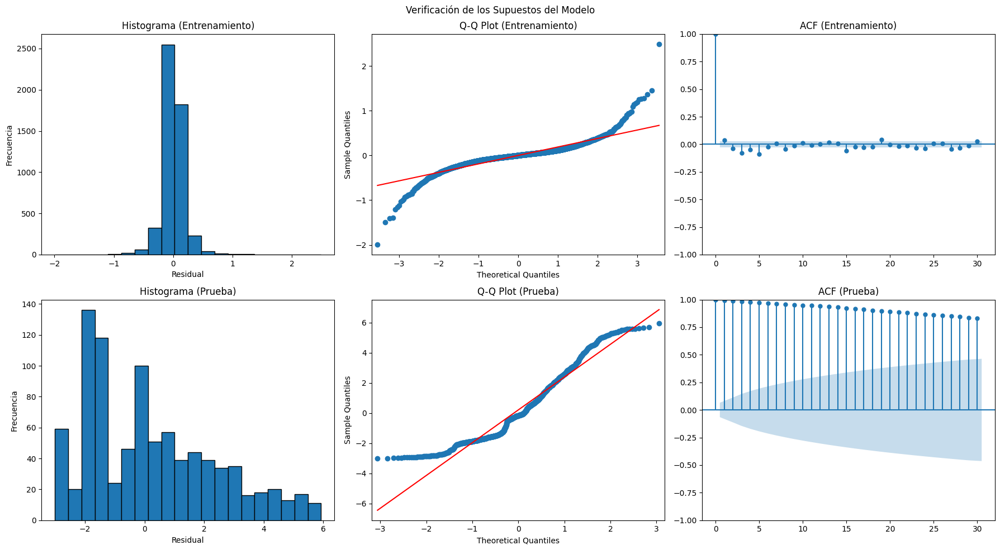

Mejores parámetros para Suavización Exponencial Doble: (0.9, 0.1) con AIC=-16915.412045895748


In [106]:
optimize_exponential_smoothing(y_train, y_test, 'Suavización Exponencial Doble', trend='add')



----- Pruebas de Hipótesis sobre los Supuestos -----
Shapiro-Wilk p-value (Entrenamiento): 0.0000
Conclusión: Los residuales NO siguen una distribución normal.

Ljung-Box p-value: 0.0000
Conclusión: Hay autocorrelación significativa en los residuales.

Breusch-Pagan p-value: 0.0000
Conclusión: No hay homocedasticidad (varianza no constante).



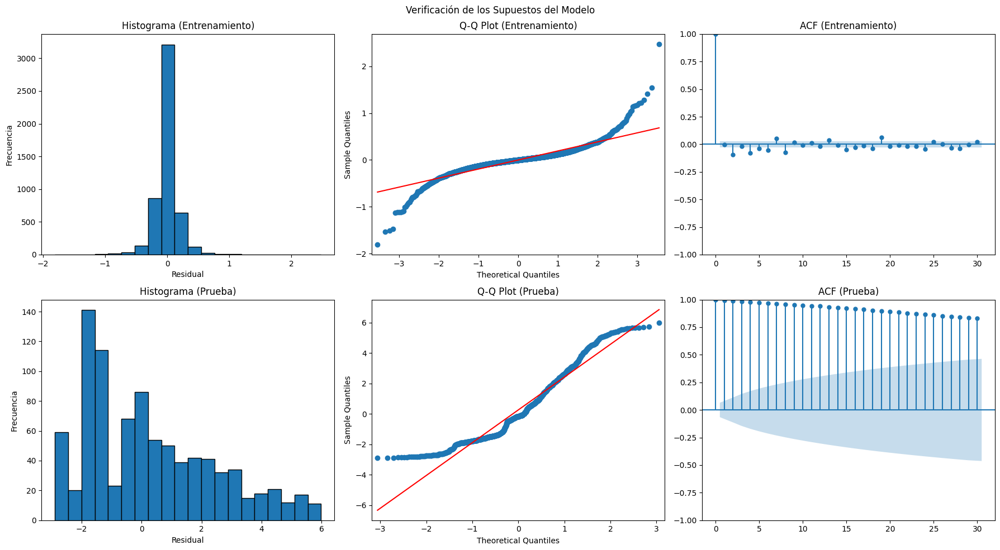

Mejores parámetros para Suavización Exponencial Triple: (0.9, 0.1, 0.1, 2) con AIC=-16694.324176173843


In [108]:

optimize_exponential_smoothing(y_train, y_test, 'Suavización Exponencial Triple', trend='add', seasonal='add', seasonal_periods=12)


In [109]:
# Definir rangos de búsqueda para p, d y q
p_values = range(0, 3)  # Autorregresivo
d_values = range(0, 2)  # Diferenciación
q_values = range(0, 3)  # Media Móvil

# Función para optimizar y aplicar las funciones de métricas y visualización
def optimize_model(model_name, order_range, y_train, y_test, data, train_size):
    best_aic = float("inf")
    best_params = None
    best_model = None
    
    # Grid search manual
    for p in order_range[0]:
        for d in order_range[1]:
            for q in order_range[2]:
                try:
                    # Entrenar modelo con los parámetros actuales
                    model = ARIMA(y_train, order=(p, d, q)).fit()
                    aic = model.aic  # Usamos AIC como métrica de evaluación
                    
                    # Si el AIC actual es mejor, actualizamos los mejores parámetros
                    if aic < best_aic:
                        best_aic = aic
                        best_params = (p, d, q)
                        best_model = model
                except:
                    continue
    
    # Entrenar el mejor modelo con los mejores parámetros encontrados
    y_train_pred = best_model.fittedvalues
    y_pred = best_model.forecast(steps=len(y_test))
    
    # Calcular y almacenar métricas usando la función que mencionas
    calculate_and_store_metrics(best_model, model_name, y_train, y_train_pred, y_test, y_pred)
    
    # Graficar los resultados usando la función de visualización
    plot_model_results_plotly(y_train, y_train_pred, y_test, y_pred, data.index, train_size, model_name)
    check_model_assumptions(best_model, y_train, y_train_pred, y_test, y_pred)
    
    # Imprimir los mejores parámetros
    print(f"Mejores parámetros para {model_name}: p={best_params[0]}, d={best_params[1]}, q={best_params[2]} con AIC={best_aic}")

# Optimización y uso para cada modelo


## Modelos Autoregresivos 

In [84]:
# Definir rangos de búsqueda para p, d y q
p_values = range(0, 3)  # Autorregresivo
d_values = range(0, 2)  # Diferenciación
q_values = range(0, 3)  # Media Móvil

# Función para optimizar y aplicar las funciones de métricas y visualización
def optimize_model(model_name, order_range, y_train, y_test, data, train_size):
    best_aic = float("inf")
    best_params = None
    best_model = None
    
    # Grid search manual
    for p in order_range[0]:
        for d in order_range[1]:
            for q in order_range[2]:
                try:
                    # Entrenar modelo con los parámetros actuales
                    model = ARIMA(y_train, order=(p, d, q)).fit()
                    aic = model.aic  # Usamos AIC como métrica de evaluación
                    
                    # Si el AIC actual es mejor, actualizamos los mejores parámetros
                    if aic < best_aic:
                        best_aic = aic
                        best_params = (p, d, q)
                        best_model = model
                except:
                    continue
    
    # Entrenar el mejor modelo con los mejores parámetros encontrados
    y_train_pred = best_model.fittedvalues
    y_pred = best_model.forecast(steps=len(y_test))
    
    # Calcular y almacenar métricas usando la función que mencionas
    calculate_and_store_metrics(best_model, model_name, y_train, y_train_pred, y_test, y_pred)
    
    # Graficar los resultados usando la función de visualización
    plot_model_results_plotly(y_train, y_train_pred, y_test, y_pred, data.index, train_size, model_name)
    
    # Imprimir los mejores parámetros
    print(f"Mejores parámetros para {model_name}: p={best_params[0]}, d={best_params[1]}, q={best_params[2]} con AIC={best_aic}")

# Optimización y uso para cada modelo



----- Pruebas de Hipótesis sobre los Supuestos -----
Shapiro-Wilk p-value (Entrenamiento): 0.0000
Conclusión: Los residuales NO siguen una distribución normal.

Ljung-Box p-value: 0.0001
Conclusión: Hay autocorrelación significativa en los residuales.

Breusch-Pagan p-value: 0.0000
Conclusión: No hay homocedasticidad (varianza no constante).



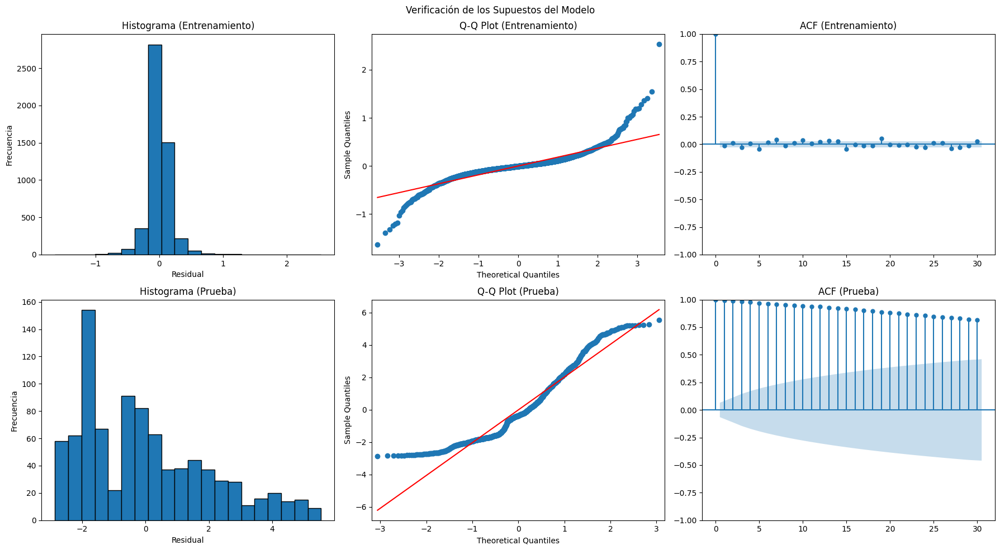

Mejores parámetros para Modelo Autorregresivo (AR): p=1, d=0, q=0 con AIC=-2747.257939483573


In [110]:

# 1. Modelo Autorregresivo (AR) -> d=0, q=0
optimize_model('Modelo Autorregresivo (AR)', (p_values, [0], [0]), y_train, y_test, data, train_size)



----- Pruebas de Hipótesis sobre los Supuestos -----
Shapiro-Wilk p-value (Entrenamiento): 0.0000
Conclusión: Los residuales NO siguen una distribución normal.

Ljung-Box p-value: 0.0000
Conclusión: Hay autocorrelación significativa en los residuales.

Breusch-Pagan p-value: 0.0000
Conclusión: No hay homocedasticidad (varianza no constante).



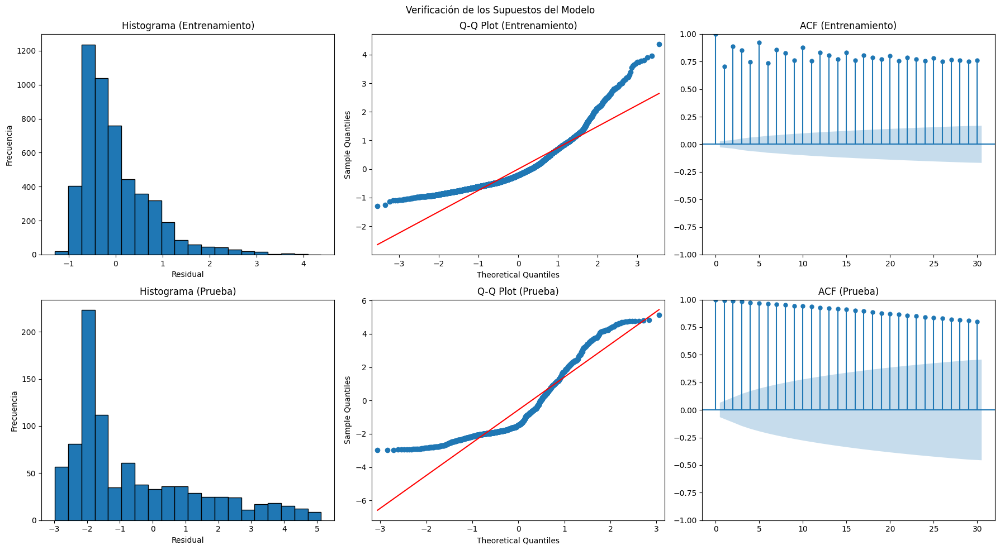

Mejores parámetros para Media Móvil (MA): p=0, d=0, q=2 con AIC=11456.413161051445


In [111]:

# 2. Modelo de Media Móvil (MA) -> p=0, d=0
optimize_model('Media Móvil (MA)', ([0], [0], q_values), y_train, y_test, data, train_size)



----- Pruebas de Hipótesis sobre los Supuestos -----
Shapiro-Wilk p-value (Entrenamiento): 0.0000
Conclusión: Los residuales NO siguen una distribución normal.

Ljung-Box p-value: 0.0008
Conclusión: Hay autocorrelación significativa en los residuales.

Breusch-Pagan p-value: 0.0000
Conclusión: No hay homocedasticidad (varianza no constante).



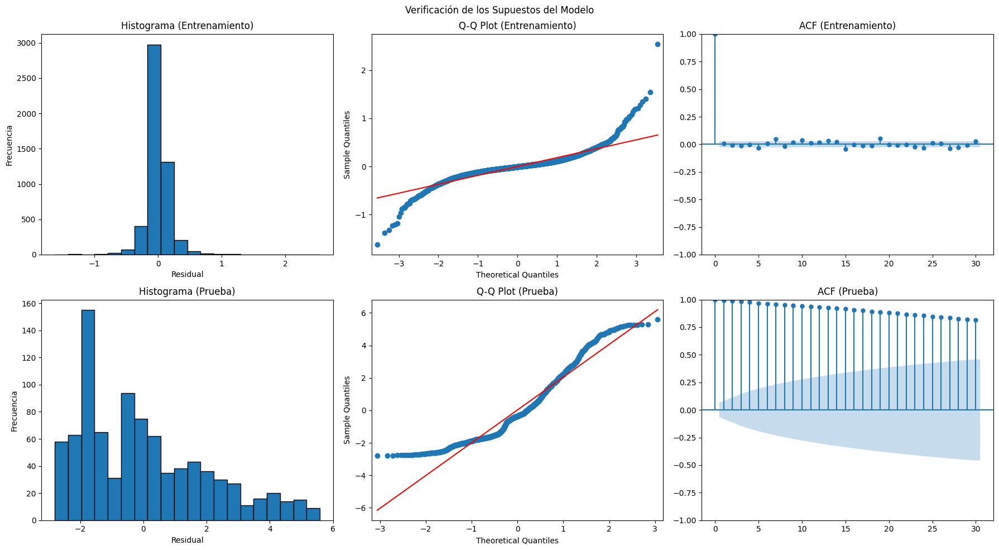

Mejores parámetros para Media Móvil Autorregresiva (ARMA): p=2, d=0, q=1 con AIC=-2749.0572998083476


In [112]:

# 3. Modelo Autorregresivo de Media Móvil (ARMA) -> d=0
optimize_model('Media Móvil Autorregresiva (ARMA)', (p_values, [0], q_values), y_train, y_test, data, train_size)



----- Pruebas de Hipótesis sobre los Supuestos -----
Shapiro-Wilk p-value (Entrenamiento): 0.0000
Conclusión: Los residuales NO siguen una distribución normal.

Ljung-Box p-value: 0.0008
Conclusión: Hay autocorrelación significativa en los residuales.

Breusch-Pagan p-value: 0.0000
Conclusión: No hay homocedasticidad (varianza no constante).



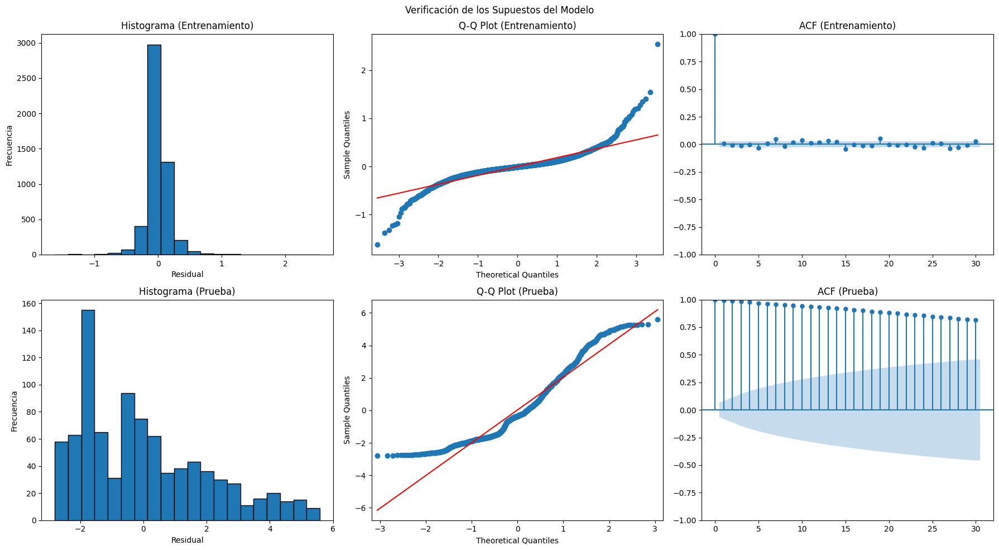

Mejores parámetros para Media Móvil Integrada Autorregresiva (ARIMA): p=2, d=0, q=1 con AIC=-2749.0572998083476


In [113]:

# 4. Modelo Autorregresivo Integrado de Media Móvil (ARIMA) -> d entre 0 y 1
optimize_model('Media Móvil Integrada Autorregresiva (ARIMA)', (p_values, d_values, q_values), y_train, y_test, data, train_size)


In [10]:
# Librerías comunes para todos los modelos
import numpy as np
import pandas as pd
import plotly.graph_objects as go
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
from sklearn.model_selection import GridSearchCV
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, SimpleRNN, LSTM, GRU, Conv1D, MaxPooling1D, Flatten
from sklearn.neural_network import MLPRegressor

In [11]:

# Función para crear características con lags
def create_lag_features(y, lag=5):
    X, y_target = [], []
    for i in range(lag, len(y)):
        X.append(y[i - lag:i])
        y_target.append(y[i])
    return np.array(X), np.array(y_target)

# Graficar resultados
def plot_results(data_index, y_train, y_train_pred, y_test, y_test_pred, title):
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=data_index[:len(y_train)], y=y_train, mode='lines', name='Entrenamiento Real'))
    fig.add_trace(go.Scatter(x=data_index[:len(y_train)], y=y_train_pred, mode='lines', name='Entrenamiento Predicho', line=dict(dash='dash')))
    fig.add_trace(go.Scatter(x=data_index[len(y_train):], y=y_test, mode='lines', name='Prueba Real'))
    fig.add_trace(go.Scatter(x=data_index[len(y_train):], y=y_test_pred, mode='lines', name='Prueba Predicha', line=dict(dash='dash')))
    fig.update_layout(title=title, xaxis_title='Fecha', yaxis_title='Cierre', legend=dict(x=0, y=1.2, orientation='h'))
    fig.show()


In [12]:
lag = 5
X_train, y_train_target = create_lag_features(y_train, lag)
X_test, y_test_target = create_lag_features(y_test, lag)

In [13]:
from sklearn.neural_network import MLPRegressor

param_grid = {
    'hidden_layer_sizes': [(50,), (100,), (100, 50)],
    'activation': ['relu', 'tanh'],
    'solver': ['adam', 'sgd'],
    'alpha': [0.0001, 0.001, 0.01],
    'learning_rate': ['constant', 'adaptive']
}

mlp = MLPRegressor(max_iter=1000, random_state=42)
grid_search = GridSearchCV(mlp, param_grid, cv=3, scoring='neg_mean_squared_error', n_jobs=-1)
grid_search.fit(X_train, y_train_target)

best_mlp = grid_search.best_estimator_
y_train_pred = best_mlp.predict(X_train)
y_test_pred = best_mlp.predict(X_test)

calculate_and_store_metrics(best_mlp, "MLP", y_train_target, y_train_pred, y_test_target, y_test_pred)
plot_results(data.index, y_train_target, y_train_pred, y_test_target, y_test_pred, 'MLP')



----- Pruebas de Hipótesis sobre los Supuestos -----
Shapiro-Wilk p-value (Entrenamiento): 0.0000
Conclusión: Los residuales NO siguen una distribución normal.

Ljung-Box p-value: 0.0000
Conclusión: Hay autocorrelación significativa en los residuales.

Breusch-Pagan p-value: 0.0000
Conclusión: No hay homocedasticidad (varianza no constante).



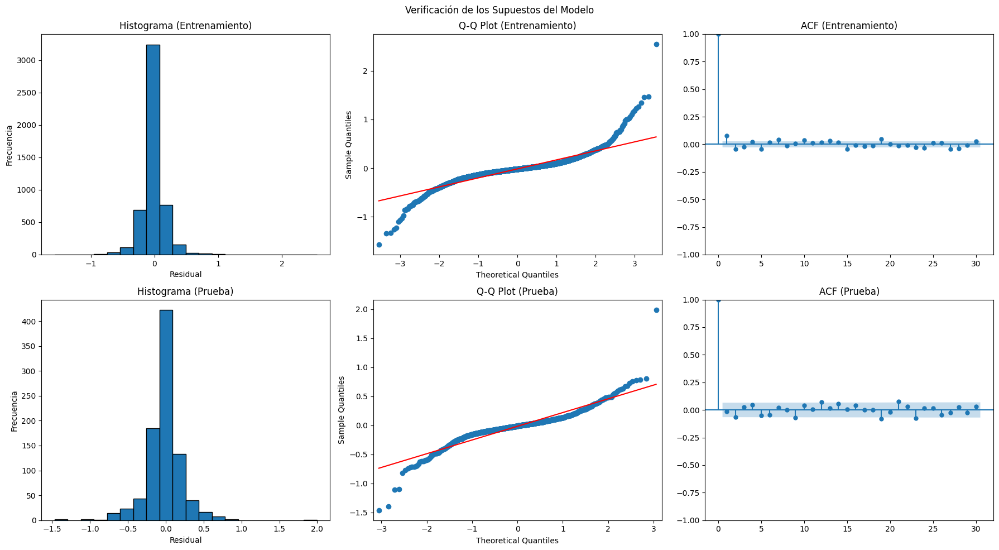

In [114]:
from sklearn.neural_network import MLPRegressor

param_grid = {
    'hidden_layer_sizes': [(50,), (100,), (100, 50)],
    'activation': ['relu', 'tanh'],
    'solver': ['adam', 'sgd'],
    'alpha': [0.0001, 0.001, 0.01],
    'learning_rate': ['constant', 'adaptive']
}

mlp = MLPRegressor(max_iter=1000, random_state=42)
grid_search = GridSearchCV(mlp, param_grid, cv=3, scoring='neg_mean_squared_error', n_jobs=-1)
grid_search.fit(X_train, y_train_target)

best_mlp = grid_search.best_estimator_
y_train_pred = best_mlp.predict(X_train)
y_test_pred = best_mlp.predict(X_test)

calculate_and_store_metrics(best_mlp, "MLP", y_train_target, y_train_pred, y_test_target, y_test_pred)
plot_results(data.index, y_train_target, y_train_pred, y_test_target, y_test_pred, 'MLP')

check_model_assumptions(best_mlp, y_train_target, y_train_pred, y_test_target, y_test_pred)


Epoch 1/10
159/159 [==============================] - 1s 3ms/step - loss: 2.6925
Epoch 2/10
159/159 [==============================] - 0s 3ms/step - loss: 0.3228
Epoch 3/10
159/159 [==============================] - 0s 3ms/step - loss: 0.1465
Epoch 4/10
159/159 [==============================] - 0s 3ms/step - loss: 0.0881
Epoch 5/10
159/159 [==============================] - 0s 2ms/step - loss: 0.0642
Epoch 6/10
159/159 [==============================] - 0s 2ms/step - loss: 0.0523
Epoch 7/10
159/159 [==============================] - 0s 2ms/step - loss: 0.0471
Epoch 8/10
159/159 [==============================] - 0s 2ms/step - loss: 0.0441
Epoch 9/10
159/159 [==============================] - 0s 2ms/step - loss: 0.0426
Epoch 10/10
28/28 [==============================] - 0s 2ms/step



----- Pruebas de Hipótesis sobre los Supuestos -----
Shapiro-Wilk p-value (Entrenamiento): 0.0000
Conclusión: Los residuales NO siguen una distribución normal.

Ljung-Box p-value: 0.0000
Conclusión: Hay autocorrelación significativa en los residuales.

Breusch-Pagan p-value: 0.0000
Conclusión: No hay homocedasticidad (varianza no constante).



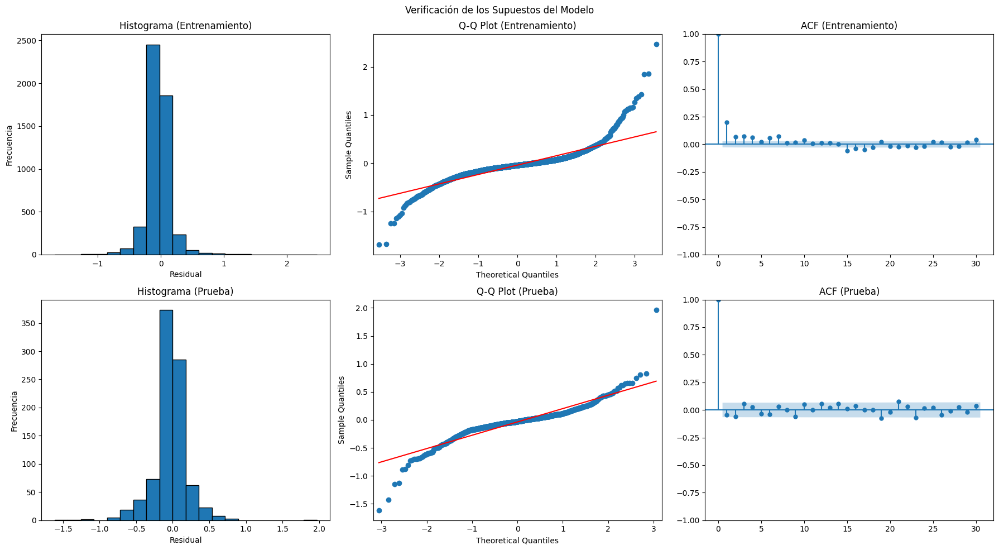

In [115]:
rnn_model = Sequential([
    SimpleRNN(50, activation='tanh', input_shape=(X_train.shape[1], 1)),
    Dense(1)
])
rnn_model.compile(optimizer='adam', loss='mse')
rnn_model.fit(X_train[..., np.newaxis], y_train_target, epochs=10, batch_size=32)

y_train_pred = rnn_model.predict(X_train[..., np.newaxis]).flatten()
y_test_pred = rnn_model.predict(X_test[..., np.newaxis]).flatten()

calculate_and_store_metrics(rnn_model, "RNN", y_train_target, y_train_pred, y_test_target, y_test_pred)
plot_results(data.index, y_train_target, y_train_pred, y_test_target, y_test_pred, 'RNN')
check_model_assumptions(rnn_model, y_train_target, y_train_pred, y_test_target, y_test_pred)

Epoch 1/10
159/159 [==============================] - 3s 3ms/step - loss: 5.7629
Epoch 2/10
159/159 [==============================] - 1s 3ms/step - loss: 0.4023
Epoch 3/10
159/159 [==============================] - 1s 3ms/step - loss: 0.1510
Epoch 4/10
159/159 [==============================] - 1s 4ms/step - loss: 0.0935
Epoch 5/10
159/159 [==============================] - 1s 4ms/step - loss: 0.0699
Epoch 6/10
159/159 [==============================] - 1s 5ms/step - loss: 0.0602
Epoch 7/10
159/159 [==============================] - 1s 4ms/step - loss: 0.0540
Epoch 8/10
159/159 [==============================] - 1s 4ms/step - loss: 0.0498
Epoch 9/10
159/159 [==============================] - 1s 4ms/step - loss: 0.0477
Epoch 10/10
28/28 [==============================] - 0s 1ms/step



----- Pruebas de Hipótesis sobre los Supuestos -----
Shapiro-Wilk p-value (Entrenamiento): 0.0000
Conclusión: Los residuales NO siguen una distribución normal.

Ljung-Box p-value: 0.0000
Conclusión: Hay autocorrelación significativa en los residuales.

Breusch-Pagan p-value: 0.0000
Conclusión: No hay homocedasticidad (varianza no constante).



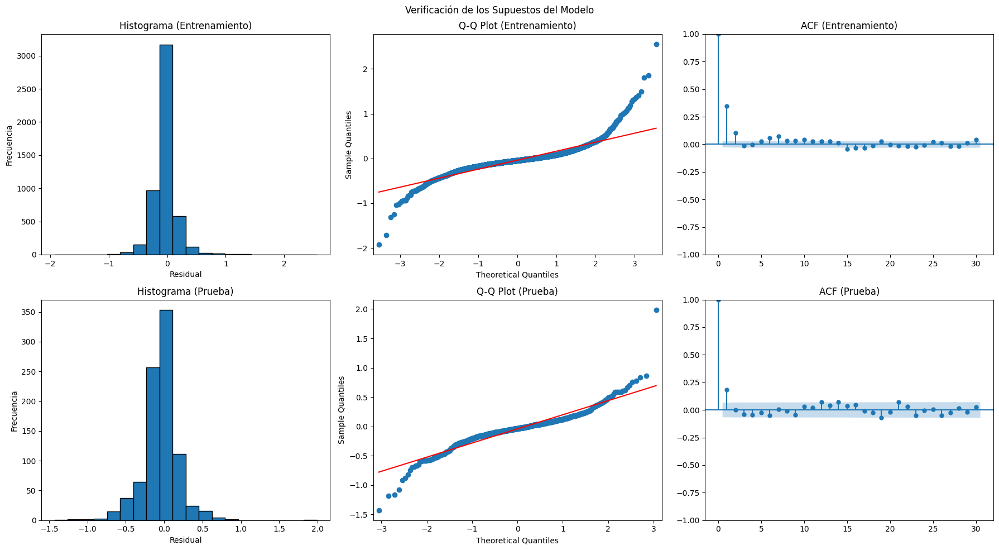

In [116]:
lstm_model = Sequential([
    LSTM(50, activation='tanh', input_shape=(X_train.shape[1], 1)),
    Dense(1)
])
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train[..., np.newaxis], y_train_target, epochs=10, batch_size=32)

y_train_pred = lstm_model.predict(X_train[..., np.newaxis]).flatten()
y_test_pred = lstm_model.predict(X_test[..., np.newaxis]).flatten()

calculate_and_store_metrics(lstm_model, "LSTM", y_train_target, y_train_pred, y_test_target, y_test_pred)
plot_results(data.index, y_train_target, y_train_pred, y_test_target, y_test_pred, 'LSTM')
rnn_model = Sequential([
    SimpleRNN(50, activation='tanh', input_shape=(X_train.shape[1], 1)),
    Dense(1)
])

check_model_assumptions(lstm_model, y_train_target, y_train_pred, y_test_target, y_test_pred)

Epoch 1/10
159/159 [==============================] - 3s 5ms/step - loss: 3.6118
Epoch 2/10
159/159 [==============================] - 1s 4ms/step - loss: 0.3195
Epoch 3/10
159/159 [==============================] - 1s 3ms/step - loss: 0.1385
Epoch 4/10
159/159 [==============================] - 1s 4ms/step - loss: 0.0797
Epoch 5/10
159/159 [==============================] - 1s 5ms/step - loss: 0.0614
Epoch 6/10
159/159 [==============================] - 1s 4ms/step - loss: 0.0525
Epoch 7/10
159/159 [==============================] - 1s 3ms/step - loss: 0.0458
Epoch 8/10
159/159 [==============================] - 1s 4ms/step - loss: 0.0433
Epoch 9/10
159/159 [==============================] - 1s 6ms/step - loss: 0.0414
Epoch 10/10
28/28 [==============================] - 0s 2ms/step



----- Pruebas de Hipótesis sobre los Supuestos -----
Shapiro-Wilk p-value (Entrenamiento): 0.0000
Conclusión: Los residuales NO siguen una distribución normal.

Ljung-Box p-value: 0.0000
Conclusión: Hay autocorrelación significativa en los residuales.

Breusch-Pagan p-value: 0.0000
Conclusión: No hay homocedasticidad (varianza no constante).



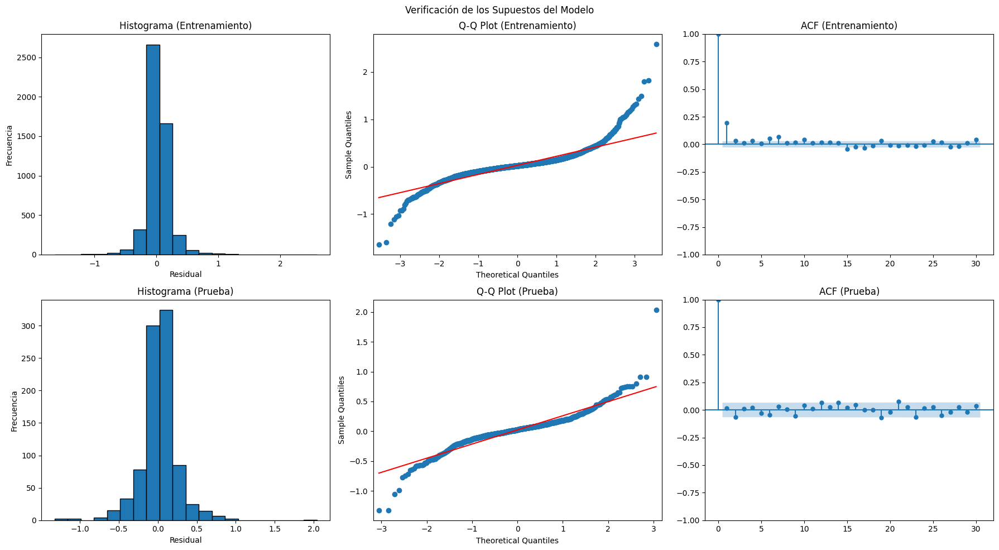

In [117]:
gru_model = Sequential([
    GRU(50, activation='tanh', input_shape=(X_train.shape[1], 1)),
    Dense(1)
])
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_train[..., np.newaxis], y_train_target, epochs=10, batch_size=32)

y_train_pred = gru_model.predict(X_train[..., np.newaxis]).flatten()
y_test_pred = gru_model.predict(X_test[..., np.newaxis]).flatten()

calculate_and_store_metrics(gru_model, "GRU", y_train_target, y_train_pred, y_test_target, y_test_pred)
plot_results(data.index, y_train_target, y_train_pred, y_test_target, y_test_pred, 'GRU')
check_model_assumptions(gru_model, y_train_target, y_train_pred, y_test_target, y_test_pred)

Epoch 1/10
159/159 [==============================] - 1s 2ms/step - loss: 2.0948
Epoch 2/10
159/159 [==============================] - 0s 1ms/step - loss: 0.0754
Epoch 3/10
159/159 [==============================] - 0s 1ms/step - loss: 0.0734
Epoch 4/10
159/159 [==============================] - 0s 2ms/step - loss: 0.0717
Epoch 5/10
159/159 [==============================] - 0s 2ms/step - loss: 0.0705
Epoch 6/10
159/159 [==============================] - 0s 1ms/step - loss: 0.0695
Epoch 7/10
159/159 [==============================] - 0s 1ms/step - loss: 0.0676
Epoch 8/10
159/159 [==============================] - 0s 2ms/step - loss: 0.0664
Epoch 9/10
159/159 [==============================] - 0s 2ms/step - loss: 0.0645
Epoch 10/10
28/28 [==============================] - 0s 2ms/step



----- Pruebas de Hipótesis sobre los Supuestos -----
Shapiro-Wilk p-value (Entrenamiento): 0.0000
Conclusión: Los residuales NO siguen una distribución normal.

Ljung-Box p-value: 0.0000
Conclusión: Hay autocorrelación significativa en los residuales.

Breusch-Pagan p-value: 0.0000
Conclusión: No hay homocedasticidad (varianza no constante).



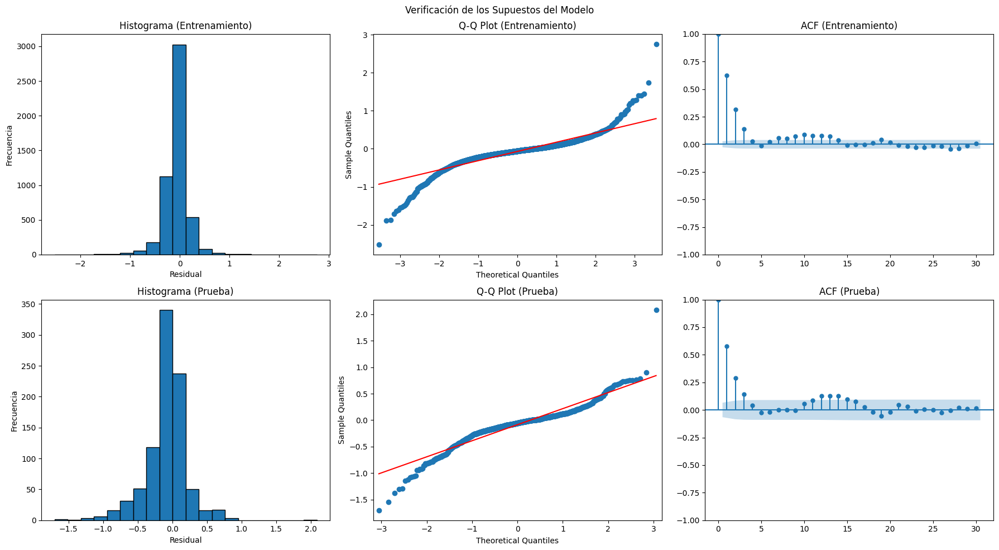

In [118]:
cnn_model = Sequential([
    Conv1D(32, kernel_size=2, activation='relu', input_shape=(X_train.shape[1], 1)),
    MaxPooling1D(pool_size=2),
    Flatten(),
    Dense(50, activation='relu'),
    Dense(1)
])
cnn_model.compile(optimizer='adam', loss='mse')
cnn_model.fit(X_train[..., np.newaxis], y_train_target, epochs=10, batch_size=32)

y_train_pred = cnn_model.predict(X_train[..., np.newaxis]).flatten()
y_test_pred = cnn_model.predict(X_test[..., np.newaxis]).flatten()

calculate_and_store_metrics(cnn_model, "CNN", y_train_target, y_train_pred, y_test_target, y_test_pred)
plot_results(data.index, y_train_target, y_train_pred, y_test_target, y_test_pred, 'CNN')
check_model_assumptions(cnn_model, y_train_target, y_train_pred, y_test_target, y_test_pred)

In [119]:
metrics_list

[{'Modelo': 'Suavización Exponencial Simple',
  'MAPE': 0.3050299412744459,
  'RMSE': 2.2755661618479315},
 {'Modelo': 'Suavización Exponencial Doble',
  'MAPE': 0.4948843749938849,
  'RMSE': 2.183332320797789},
 {'Modelo': 'Suavización Exponencial Triple',
  'MAPE': 0.481132028429333,
  'RMSE': 2.172157107004014},
 {'Modelo': 'Suavización Exponencial Simple',
  'MAPE': 0.3050299412744459,
  'RMSE': 2.2755661618479315},
 {'Modelo': 'Suavización Exponencial Doble',
  'MAPE': 0.4948843749938849,
  'RMSE': 2.183332320797789},
 {'Modelo': 'Suavización Exponencial Triple',
  'MAPE': 0.481132028429333,
  'RMSE': 2.172157107004014},
 {'Modelo': 'Modelo Autorregresivo (AR)',
  'MAPE': 0.4797479986202438,
  'RMSE': 2.027128570422767},
 {'Modelo': 'Media Móvil (MA)',
  'MAPE': 0.5693545488333402,
  'RMSE': 2.048667170599585},
 {'Modelo': 'Media Móvil Autorregresiva (ARMA)',
  'MAPE': 0.4717561710074295,
  'RMSE': 2.0196212587123963},
 {'Modelo': 'Media Móvil Integrada Autorregresiva (ARIMA)',
  